In [137]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import datetime

In [326]:
import os
os.chdir('C:/Users/barad/OneDrive - University of South Florida/Desktop/Hospitals.csv')

In [327]:
usa  = pd.read_csv("Hospitals.csv")

In [328]:
usa.describe()

,X,Y,OBJECTID,ID,ZIP,POPULATION,LATITUDE,LONGITUDE,NAICS_CODE,ST_FIPS,TTL_STAFF,BEDS
count,7570.000000,7570.000000,7570.000000,7.570000e+03,7570.000000,7570.000000,7570.000000,7570.000000,7570.000000,7569.000000,7569.0,7569.000000
mean,-92.387417,37.331745,11287.911889,2.520163e+07,53609.916645,42.392999,37.331744,-92.387417,622140.951123,29.472189,-999.0,48.257233
std,15.995659,5.775099,2189.726558,3.899382e+07,27518.769850,370.336773,5.775099,15.995660,66.107596,16.304241,0.0,362.645616
min,-176.640263,-14.290242,7497.000000,4.000000e+00,605.000000,-999.000000,-14.290242,-176.640263,622110.000000,1.000000,-999.0,-999.000000
25%,-98.199507,33.463963,9392.250000,3.974885e+06,32028.000000,25.000000,33.463963,-98.199507,622110.000000,17.000000,-999.0,25.000000
50%,-90.074141,37.976913,11288.000000,9.640840e+06,54966.000000,65.000000,37.976913,-90.074141,622110.000000,29.000000,-999.0,66.000000
75%,-81.774617,41.322441,13183.750000,2.241059e+07,76781.000000,178.000000,41.322441,-81.774617,622110.000000,44.000000,-999.0,178.000000
max,145.724472,71.292847,15081.000000,1.676842e+08,99929.000000,1592.000000,71.292847,145.724472,622310.000000,78.000000,-999.0,1592.000000


In [329]:
ushospital= usa.loc[:,["ID","NAME","ADDRESS","COUNTY","CITY","STATE","TELEPHONE","LATITUDE","LONGITUDE","TYPE","BEDS"]]

In [330]:
ushospital = ushospital[ushospital.BEDS != -999]
ushospital.BEDS.sum()

1014609.0

In [331]:
ushospital.count()

ID           6920
NAME         6920
ADDRESS      6920
COUNTY       6920
CITY         6920
STATE        6920
TELEPHONE    6920
LATITUDE     6920
LONGITUDE    6920
TYPE         6920
BEDS         6919
dtype: int64

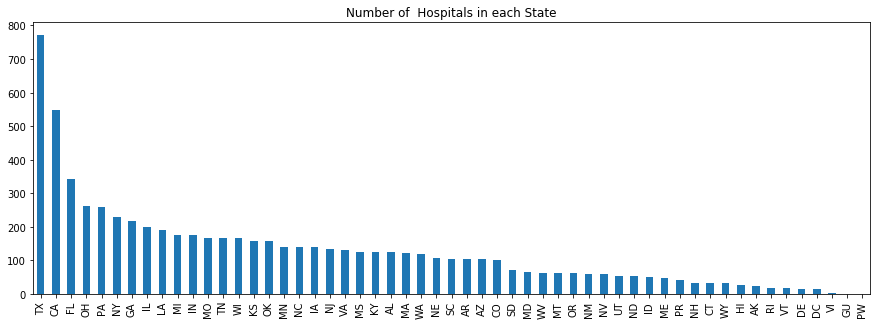

In [332]:
plt.figure(figsize=(15,5))
plt.title('Number of  Hospitals in each State')
ushospital.STATE.value_counts().plot.bar();

In [374]:
import folium
usa_map = folium.Map(location=[39.0902,-97.922211 ], zoom_start=4,tiles='cartodbpositron')

for LATITUDE, LONGITUDE,NAME,ADDRESS,BEDS in zip(ushospital['LATITUDE'], ushospital['LONGITUDE'],ushospital['NAME'],ushospital['ADDRESS'],ushospital['BEDS']):
    folium.CircleMarker([LATITUDE, LONGITUDE],
                        radius=BEDS/100,
                        color='red',
                         popup =('Name:' + str(NAME) + '<br>'
                             'Address:' + str(ADDRESS) + '<br>'
                             'beds:' + str(BEDS) + '<br>'
                             ),
                      
                        fill_color='red',
                        fill_opacity=0.7 ).add_to(usa_map)
usa_map

In [334]:
df_hb = ushospital.loc[ushospital['STATE'] == 'FL']
df_hb

,ID,NAME,ADDRESS,COUNTY,CITY,STATE,TELEPHONE,LATITUDE,LONGITUDE,TYPE,BEDS
1328,82132501,LAKEVIEW CENTER - PSYCHIATRIC HOSPITAL,1201 W HERNANDEZ ST,ESCAMBIA,PENSACOLA,FL,(850) 432-1222,30.432357,-87.233156,PSYCHIATRIC,16.0
1329,82333328,HIGH POINT TREATMENT CENTER,5960 SW 106TH AVE,BROWARD,COOPER CITY,FL,(954) 680-2700,26.046132,-80.287217,PSYCHIATRIC,88.0
1330,82232827,NEMOURS CHILDREN'S HOSPITAL,13535 NEMOURS PKWY,ORANGE,ORLANDO,FL,(407) 567-4000,28.376800,-81.273639,GENERAL ACUTE CARE,100.0
1331,35632714,HEALTHSOUTH REHABILITATION HOSPITAL OF ALTAMON...,831 S STATE RD 434,SEMINOLE,ALTAMONTE SPRINGS,FL,(407) 587-8600,28.646331,-81.413059,REHABILITATION,50.0
1332,35733472,BETHESDA HOSPITAL WEST,9655 W BOYNTON BEACH BLVD,PALM BEACH,BOYNTON BEACH,FL,(561) 737-7733,26.529728,-80.199768,GENERAL ACUTE CARE,401.0
...,...,...,...,...,...,...,...,...,...,...,...
7223,80834950,LAWNWOOD PAVILION - PSYCHIATRIC HOSPITAL,1860 N LAWNWOOD CIR,ST. LUCIE,FORT PIERCE,FL,(772) 466-1500,27.433801,-80.345638,PSYCHIATRIC,24.0
7224,81933321,UNIVERSITY PAVILION - PSYCHIATRIC HOSPITAL,7425 N UNIVERSITY DR,BROWARD,TAMARAC,FL,(954) 722-9933,26.213155,-80.256775,PSYCHIATRIC,60.0
7297,167684212,UF HEALTH NORTH,15255 MAX LEGGETT PARKWAY,DUVAL,JACKSONVILLE,FL,(904) 237-5228,30.483998,-81.633419,GENERAL ACUTE CARE,92.0
7349,167684105,BLACKBERRY CENTER,91 BEEHIVE CIR,OSCEOLA,SAINT CLOUD,FL,(321) 805-5090,28.259935,-81.313165,PSYCHIATRIC,42.0


In [335]:
hospital_grp_usa = ushospital.groupby(['COUNTY']).sum().reset_index()

In [336]:
hospital_grp_usa.head()

,COUNTY,ID,LATITUDE,LONGITUDE,BEDS
0,ABBEVILLE,4229620,34.159720,-82.383037,25.0
1,ACADIA,17911629,90.853429,-276.931185,59.0
2,ADA,328169583,348.883385,-930.101887,1354.0
3,ADAIR,29032038,154.403274,-366.978799,262.0
4,ADAMS,531070584,727.291886,-1772.646168,1757.0


In [337]:
hospital_grp_usa.drop(["LATITUDE", "LONGITUDE","ID"], axis = 1, inplace = True) 


In [338]:
hospital_grp_usa.head()

,COUNTY,BEDS
0,ABBEVILLE,25.0
1,ACADIA,59.0
2,ADA,1354.0
3,ADAIR,262.0
4,ADAMS,1757.0


In [339]:
os.chdir('D:/USF MS BAIS CourseWork/Sem-2/Data Visualization/PythonPresentation')

In [340]:
Covid_Us = pd.read_csv('US_Counties_Covid.csv')

In [341]:
Covid_Us = Covid_Us.dropna(how='any',axis=0) 


In [342]:
Covid_Us.rename(columns = {'County':'COUNTY'}, inplace = True) 


In [381]:
Covid_Us.Confirmed.sum()

181055

In [344]:
Covid_Us['COUNTY'] = Covid_Us['COUNTY'].str.upper() 


In [376]:
df1 = Covid_Us.merge(hospital_grp_usa, on = "COUNTY", how = 'left')

In [377]:
df1

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active,BEDS
0,45001.0,ABBEVILLE,South Carolina,US,34.223334,-82.461707,4,0,0,0,25.0
1,22001.0,ACADIA,Louisiana,US,30.295065,-92.414197,39,1,0,0,59.0
2,51001.0,ACCOMACK,Virginia,US,37.767072,-75.632346,7,0,0,0,NaN
3,16001.0,ADA,Idaho,US,43.452658,-116.241552,195,3,0,0,1354.0
4,19001.0,ADAIR,Iowa,US,41.330756,-94.471059,1,0,0,0,262.0
...,...,...,...,...,...,...,...,...,...,...,...
2115,51199.0,YORK,Virginia,US,37.243748,-76.544128,14,1,0,0,1732.0
2116,48503.0,YOUNG,Texas,US,33.176597,-98.687909,1,0,0,0,67.0
2117,6115.0,YUBA,California,US,39.262559,-121.353564,6,0,0,0,173.0
2118,4027.0,YUMA,Arizona,US,32.768957,-113.906667,9,0,0,0,438.0


In [378]:
df1 = df1.dropna(how='any',axis=0) 


In [379]:
df1.isnull().sum()

FIPS              0
COUNTY            0
State             0
Country_Region    0
LATITUDE          0
LONGITUDE         0
Confirmed         0
Deaths            0
Recovered         0
Active            0
BEDS              0
dtype: int64

In [380]:
import folium
usa_covid = folium.Map(location=[27.78778121,-82.34510464], zoom_start=10,tiles='cartodbpositron')

for LATITUDE, LONGITUDE,COUNTY, Confirmed,BEDS in zip(df1['LATITUDE'], df1['LONGITUDE'],df1['COUNTY'],df1['Confirmed'],df1['BEDS'] ):
    folium.CircleMarker([LATITUDE, LONGITUDE],
                        radius=Confirmed/1000,
                        color='red',
                         popup =('County:' + str(COUNTY) + '<br>'
                             'Confirmed:' + str(Confirmed) + '<br>'
                             'beds:' + str(BEDS) + '<br>'
                           ),
                      
                        fill_color='red',
                        fill_opacity=0.7 ).add_to(usa_covid)
usa_covid

In [350]:
df_hb = df1.loc[df1['State'] == 'Florida']


In [351]:
df_hb = df_hb.sort_values('Confirmed',ascending=False).head(5)

In [352]:
df_hb

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active,BEDS
1274,12086.0,MIAMI-DADE,Florida,US,25.611236,-80.551706,2123,7,0,0,10243.0
194,12011.0,BROWARD,Florida,US,26.151847,-80.487256,1219,12,0,0,6803.0
1471,12099.0,PALM BEACH,Florida,US,26.646763,-80.465360,551,14,0,0,4993.0
1436,12095.0,ORANGE,Florida,US,28.513676,-81.317995,373,4,0,0,15136.0
848,12057.0,HILLSBOROUGH,Florida,US,27.927656,-82.320132,305,3,0,0,6021.0


In [353]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go

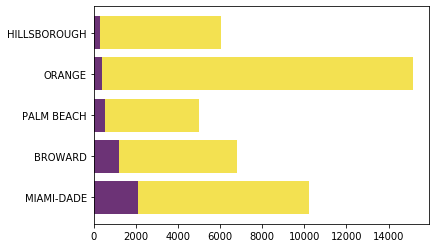

In [354]:
plt.barh(df_hb.COUNTY, df_hb.BEDS, color="#f3e151")  
# careful: notice "bottom" parameter became "left"
plt.barh(df_hb.COUNTY, df_hb.Confirmed, color="#6c3376")
plt.show()

In [355]:
df_NY = df1.loc[df1['State'] == 'New York']


In [300]:
#df_NY

In [356]:
hospital_grp_usa
df_NY = hospital_grp_usa.loc[hospital_grp_usa['COUNTY'] == 'NEW YORK']
df_NY

,COUNTY,BEDS
1005,NEW YORK,11052.0


In [357]:
Covid_Us
df_NY = Covid_Us.loc[Covid_Us['State'] == 'New York']


In [358]:
Covid_Us.at[ 1397,'COUNTY'] = 'NEW YORK'
#Covid_Us1=Covid_Us

In [372]:
Covid_Us1

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active,1,2,1,YUMA
0,45001.0,ABBEVILLE,South Carolina,US,34.223334,-82.461707,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,22001.0,ACADIA,Louisiana,US,30.295065,-92.414197,39.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN
2,51001.0,ACCOMACK,Virginia,US,37.767072,-75.632346,7.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,16001.0,ADA,Idaho,US,43.452658,-116.241552,195.0,3.0,0.0,0.0,NaN,NaN,NaN,NaN
4,19001.0,ADAIR,Iowa,US,41.330756,-94.471059,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2168,48503.0,YOUNG,Texas,US,33.176597,-98.687909,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2169,6115.0,YUBA,California,US,39.262559,-121.353564,6.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2170,4027.0,YUMA,Arizona,US,32.768957,-113.906667,9.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2171,8125.0,YUMA,Colorado,US,40.003468,-102.425867,2.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [360]:
#Covid_Us1.at[ 1397,'COUNTY'] = 'NEW YORK'
Covid_Us.loc[Covid_Us['State'] == 'New York']

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active
20,36001.0,ALBANY,New York,US,42.600603,-73.977239,226,1,0,0
28,36003.0,ALLEGANY,New York,US,42.257484,-78.027505,9,1,0,0
192,36007.0,BROOME,New York,US,42.159032,-75.813261,38,3,0,0
304,36009.0,CATTARAUGUS,New York,US,42.247782,-78.679231,6,0,0,0
305,36011.0,CAYUGA,New York,US,42.912617,-76.557316,4,0,0,0
330,36013.0,CHAUTAUQUA,New York,US,42.227692,-79.366918,7,0,0,0
335,36015.0,CHEMUNG,New York,US,42.138911,-76.763880,20,0,0,0
336,36017.0,CHENANGO,New York,US,42.494300,-75.608876,19,0,0,0
412,36019.0,CLINTON,New York,US,44.745309,-73.678754,21,0,0,0
433,36021.0,COLUMBIA,New York,US,42.248193,-73.630891,36,1,0,0


In [361]:
df2 = Covid_Us.merge(hospital_grp_usa, on = "COUNTY", how = 'left')
df2

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active,BEDS
0,45001.0,ABBEVILLE,South Carolina,US,34.223334,-82.461707,4,0,0,0,25.0
1,22001.0,ACADIA,Louisiana,US,30.295065,-92.414197,39,1,0,0,59.0
2,51001.0,ACCOMACK,Virginia,US,37.767072,-75.632346,7,0,0,0,NaN
3,16001.0,ADA,Idaho,US,43.452658,-116.241552,195,3,0,0,1354.0
4,19001.0,ADAIR,Iowa,US,41.330756,-94.471059,1,0,0,0,262.0
...,...,...,...,...,...,...,...,...,...,...,...
2115,51199.0,YORK,Virginia,US,37.243748,-76.544128,14,1,0,0,1732.0
2116,48503.0,YOUNG,Texas,US,33.176597,-98.687909,1,0,0,0,67.0
2117,6115.0,YUBA,California,US,39.262559,-121.353564,6,0,0,0,173.0
2118,4027.0,YUMA,Arizona,US,32.768957,-113.906667,9,0,0,0,438.0


In [362]:
df_hbny = df2.loc[df2['State'] == 'New York']


In [394]:
df_hbny = df_hbny.sort_values('Confirmed',ascending=False).head(6)

In [395]:
df_hbny

,FIPS,COUNTY,State,Country_Region,LATITUDE,LONGITUDE,Confirmed,Deaths,Recovered,Active,BEDS
1381,36061.0,NEW YORK,New York,US,40.767273,-73.971526,43119,932,0,0,11052.0
2034,36119.0,WESTCHESTER,New York,US,41.162784,-73.757417,9967,10,0,0,3235.0
1364,36059.0,NASSAU,New York,US,40.740665,-73.589419,8544,48,0,0,4397.0


In [388]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go

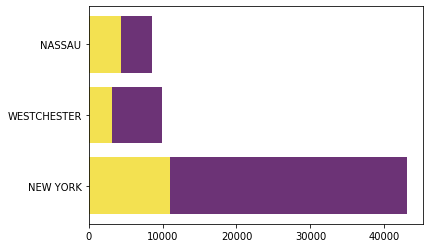

In [389]:
plt.barh(df_hbny.COUNTY, df_hbny.Confirmed, color="#6c3376")
plt.barh(df_hbny.COUNTY, df_hbny.BEDS, color="#f3e151")  
# careful: notice "bottom" parameter became "left"
# reverse col 
plt.show()